# Home Credit Prediction: EDA of Bureau Table


For an up-to-date version / full view of the plotly - plots, please, go to

EDA - Bureau Table: https://drive.google.com/file/d/16Yrojb1GLrqCbb9b1ADqxFHryxDxxbyw/view?usp=sharing


List of all notebooks and resources for this project: https://drive.google.com/file/d/1Z8vPNZAcivWOxeh3UKFfeARbQCMkQ_NR/view?usp=sharing

## Import Modules

In [60]:
%%capture
! pip install -q pingouin
! pip install -q scikit-optimize

In [61]:
import numpy as np
import pandas as pd

import sys
import os
import warnings
from importlib import reload

from dask import dataframe as dd
#import matplotlib.pyplot as plt
#import seaborn as sns
#import plotly.express as px
#
#from statsmodels.stats.proportion import proportions_ztest
import pingouin as pg



from google.colab import drive
drive.mount("/content/gdrive")

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_rows')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [62]:
home_folder = '/content/gdrive/MyDrive/Colab Notebooks/Portfolio/ML_HomeCredit_DefaultRiskEvaluation/'

### Functions

The Python-file with the functions is at
https://drive.google.com/file/d/17IchsTGy2QI9sq0LTIvGvxAk2mrWs4Xz/view?usp=sharing

In [63]:
%load_ext autoreload
%autoreload 2

sys.path.append(home_folder)
import driskfunc as dfunc

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1. Load and Update Data

data source: https://storage.googleapis.com/341-home-credit-default/home-credit-default-risk.zip

description: https://storage.googleapis.com/341-home-credit-default/Home%20Credit%20Default%20Risk.pdf

In [64]:
HCdescr = pd.read_csv(home_folder+'data/HomeCredit_columns_description.csv', encoding='latin1') #, dtype=dtype)


In [65]:
HCdescr.loc[HCdescr.Table == 'bureau.csv']

,Unnamed: 0,Table,Row,Description,Special
122,125,bureau.csv,SK_ID_CURR,"ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau",hashed
123,126,bureau.csv,SK_BUREAU_ID,Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application),hashed
124,127,bureau.csv,CREDIT_ACTIVE,Status of the Credit Bureau (CB) reported credits,NaN
125,128,bureau.csv,CREDIT_CURRENCY,Recoded currency of the Credit Bureau credit,recoded
126,129,bureau.csv,DAYS_CREDIT,How many days before current application did client apply for Credit Bureau credit,time only relative to the application
127,130,bureau.csv,CREDIT_DAY_OVERDUE,Number of days past due on CB credit at the time of application for related loan in our sample,NaN
128,131,bureau.csv,DAYS_CREDIT_ENDDATE,Remaining duration of CB credit (in days) at the time of application in Home Credit,time only relative to the application
129,132,bureau.csv,DAYS_ENDDATE_FACT,Days since CB credit ended at the time of application in Home Credit (only for closed credit),time only relative to the application
130,133,bureau.csv,AMT_CREDIT_MAX_OVERDUE,Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample),NaN
131,134,bureau.csv,CNT_CREDIT_PROLONG,How many times was the Credit Bureau credit prolonged,NaN


In [66]:
HCapp_bureau = dd.read_csv(home_folder+'data/bureau.csv')
df = HCapp_bureau
df_name = 'HCapp bureau'

In [67]:
%%capture
#! mkdir home_folder+'cleaned/'
df_final = dd.read_csv(home_folder+'cleaned/HC_bureau_cleaned.csv')

# EDA

EDA:
- Statistical Overview
- Distributions of Parameters
- Correlation of features
- Scatterplots of numerical features against each other
- Hypothesis Tests to assess the significance of the features


EDA-obectives:?

What do we know about the borrower from which we can predict whether he/she will be able to pay the loan?

* possible predictors for payment issue loans based on
  * features on borrower's current situation
  * features on borrower's credit and payment behaviour prior to loan application


---> discard all parameters related a running payments of the loan and status.


## Load Target Data

In [68]:
HCapp_target = dd.read_csv(home_folder+'data/application_train.csv'
                           )[['SK_ID_CURR', 'TARGET','AMT_REQ_CREDIT_BUREAU_QRT']]

In [69]:
nan_overview_df = dfunc.nan_type_overview_dd(HCapp_target, len(HCapp_target))
nan_overview_df.round(1).style.background_gradient(cmap="Blues")

,type,NaN[abs],NaN[%]
SK_ID_CURR,int64,0,0.000000
TARGET,int64,0,0.000000
AMT_REQ_CREDIT_BUREAU_QRT,float64,41519,13.500000


In [70]:
len(HCapp_target.loc[~(HCapp_target.AMT_REQ_CREDIT_BUREAU_QRT.isna())])

265992

In [71]:
df_target_bureau = HCapp_target.merge(df_final, on = ['SK_ID_CURR'],
                                 how = 'inner')

In [72]:
bureau_size = len(df_target_bureau)

In [73]:
bureau_size, len(HCapp_target)

(263491, 307511)

In [74]:
SAMPLES = 10000
frac = SAMPLES/bureau_size
df_target_bureau_sampled = df_target_bureau.sample(frac=frac, replace=False,
                                                   random_state=10)

df_target = df_target_bureau_sampled.compute()


In [75]:
#df_target = df_target_bureau.compute()

df_mod = df_target['TARGET']
df_mod = df_mod.mask((df_mod==1), 'Payment Issues')
df_mod = df_mod.mask((df_mod==0), 'No Payment Issues')
df_target['TARGET_mod'] = df_mod

num_feat = df_target.select_dtypes(include=np.number).columns.tolist()

## Distributions per Feature

Let's inspect the distribution of the features and their transforms/composites:

In [76]:
num_feat

['SK_ID_CURR',
 'TARGET',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY',
 'DAYS_CREDIT_ENDDATE_mod',
 'DAYS_ENDDATE_FACT_mod',
 'TERM_PLANNED_months',
 'TERM_ACTUAL_months',
 'TERM_change_months',
 'AMT_ANNUITY_plain',
 'int_rate',
 'AMT_ANNUITY_CREDIT_ratio',
 'AMT_CREDIT_SUM_debt_limit',
 'AMT_CREDIT_DEBT_LIMIT_RATIO',
 'AMT_CREDIT_DEBT_SUM_RATIO',
 'CNT_CREDIT_PROLONG_bin',
 'CREDIT_DAY_OVERDUE_cat',
 'CURRENCY_1',
 'ACTIVITY_Active',
 'ACTIVITY_Closed',
 'ACTIVITY_Sold-Bad',
 'TYPE_Car_loan',
 'TYPE_Consumer_credit',
 'TYPE_Credit_card',
 'TYPE_Microloan',
 'TYPE_Mortgage',
 'TYPE_Other_loan_types',
 'MONTHS_BALANCE',
 'MONTHS_BALANCE_count',
 'STATUS_0_mean',
 'STATUS_1_mean',
 'STATUS_2_mean',
 'STATUS_3_mean',
 'STATUS_4_mean',
 'STATUS_5_mean',
 'STATUS_C_mean',
 'STATUS_X_me

In [77]:
days = ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
        'DAYS_CREDIT_ENDDATE_mod',
        'DAYS_ENDDATE_FACT_mod',
        'DAYS_CREDIT_UPDATE'] #log

amt =['AMT_CREDIT_MAX_OVERDUE', 'AMT_CREDIT_SUM',
      'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
      'AMT_CREDIT_SUM_OVERDUE', 'AMT_ANNUITY'] #log

amt_sum = ['AMT_ANNUITY_sum_active_bureau',
           'AMT_CREDIT_MAX_OVERDUE_sum_active',
           'AMT_CREDIT_SUM_sum_active',
           'AMT_CREDIT_SUM_DEBT_sum_active',
           'AMT_CREDIT_SUM_LIMIT_sum_active',
           'AMT_CREDIT_SUM_OVERDUE_sum_active',
          ]

terms = ['SK_ID_BUREAU_count', 'TERM_PLANNED_months', 'TERM_ACTUAL_months',
       'TERM_change_months', 'MONTHS_BALANCE', 'MONTHS_BALANCE_count'] #log

active = ['ACTIVITY_Active', 'ACTIVITY_Closed', 'ACTIVITY_Sold-Bad']

loan_type = ['TYPE_Car_loan', 'TYPE_Consumer_credit', 'TYPE_Credit_card',
             'TYPE_Microloan', 'TYPE_Mortgage', 'TYPE_Other_loan_types']

status =['STATUS_0_mean', 'STATUS_1_mean', 'STATUS_2_mean',
         'STATUS_3_mean', 'STATUS_4_mean', 'STATUS_5_mean',
         'STATUS_C_mean', 'STATUS_X_mean', 'CREDIT_DAY_OVERDUE_cat',
         'CNT_CREDIT_PROLONG', 'CNT_CREDIT_PROLONG_bin']

terms = ['SK_ID_BUREAU_count', 'SK_ID_BUREAU_active_count',
         'TERM_PLANNED_months', 'TERM_ACTUAL_months', 'TERM_change_months',
         'MONTHS_BALANCE', 'MONTHS_BALANCE_count'] #log

sum_feat = days + amt + active + loan_type + status + terms

rest = num_feat.copy()   # find any feature not in lists above
for item in sum_feat:
    if item in rest:
        rest.remove(item)

hue = 'TARGET_mod'

#### Days Relative to Application Date

In [78]:
%reload_ext autoreload

features = days #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [79]:
log_days= []
for feat in days:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_days.append('log_'+feat)

In [80]:
%reload_ext autoreload

features = log_days #features #[:10]
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Amounts

In [81]:
%reload_ext autoreload

features = amt #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [82]:
log_amt= []
for feat in amt:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_amt.append('log_'+feat)

In [83]:
%reload_ext autoreload

features = log_amt
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Summed Amounts

In [84]:
%reload_ext autoreload

features = amt_sum #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [85]:
log_amt_sum = []
for feat in amt:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_amt_sum.append('log_'+feat)

In [86]:
%reload_ext autoreload

features = log_amt_sum
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Terms and Months

In [87]:
%reload_ext autoreload

features = terms
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [88]:
log_terms= []
for feat in terms:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_terms.append('log_'+feat)

In [89]:
%reload_ext autoreload

features = log_terms
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### Fraction of Contracts per ID_CURR on ACTIVE-Categories

In [90]:
%reload_ext autoreload

features = active
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Fraction of Contracts per ID_CURR on (Loan) TYPE-Categories

In [91]:
%reload_ext autoreload

features = loan_type
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Mean per ID_CURR on STATUS-Category Fractions from 'bureau_balance' and on OVERDUE and PROLOG

In [92]:
%reload_ext autoreload

features = status
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

#### Unclassified Features

In [93]:
%reload_ext autoreload

features = rest #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

if len(rest) > 0:
    dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')
else:
    print('Nothing to plot here...')

Output hidden; open in https://colab.research.google.com to view.

## Reduce numerical Features to Main Correlations with Target

#### Correlation with Target

Evaluate the main correlation with TARGET and discard cases of suspected multicolinearity (due to high similarity of the reported property):

In [94]:
df_target.columns

Index(['SK_ID_CURR', 'TARGET', 'AMT_REQ_CREDIT_BUREAU_QRT', 'DAYS_CREDIT',
       'CREDIT_DAY_OVERDUE', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY',
       'DAYS_CREDIT_ENDDATE_mod', 'DAYS_ENDDATE_FACT_mod',
       'TERM_PLANNED_months', 'TERM_ACTUAL_months', 'TERM_change_months',
       'AMT_ANNUITY_plain', 'int_rate', 'AMT_ANNUITY_CREDIT_ratio',
       'AMT_CREDIT_SUM_debt_limit', 'AMT_CREDIT_DEBT_LIMIT_RATIO',
       'AMT_CREDIT_DEBT_SUM_RATIO', 'CNT_CREDIT_PROLONG_bin',
       'CREDIT_DAY_OVERDUE_cat', 'CURRENCY_1', 'ACTIVITY_Active',
       'ACTIVITY_Closed', 'ACTIVITY_Sold-Bad', 'TYPE_Car_loan',
       'TYPE_Consumer_credit', 'TYPE_Credit_card', 'TYPE_Microloan',
       'TYPE_Mortgage', 'TYPE_Other_loan_types', 'MONTHS_BALANCE',
       'MONTHS_BALANCE_count', 'STATUS_0_mean', 'STATUS_1_mean',
       'STATUS_2_mean', 'STATUS_3_mean', 'STA

In [95]:
original = ['TARGET', 'DAYS_CREDIT',
       'CREDIT_DAY_OVERDUE', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY',
       'DAYS_CREDIT_ENDDATE_mod', 'DAYS_ENDDATE_FACT_mod',
       'TERM_PLANNED_months', 'TERM_ACTUAL_months', 'TERM_change_months',
       'AMT_ANNUITY_plain', 'int_rate', 'AMT_ANNUITY_CREDIT_ratio',
       'AMT_CREDIT_SUM_debt_limit', 'AMT_CREDIT_DEBT_LIMIT_RATIO',
       'AMT_CREDIT_DEBT_SUM_RATIO', 'CNT_CREDIT_PROLONG_bin',
       'CREDIT_DAY_OVERDUE_cat', 'ACTIVITY_Active', 'ACTIVITY_Closed',
       'ACTIVITY_Sold-Bad', 'TYPE_Car_loan', 'TYPE_Consumer_credit',
       'TYPE_Credit_card', 'TYPE_Microloan', 'TYPE_Mortgage',
       'TYPE_Other_loan_types', 'MONTHS_BALANCE', 'MONTHS_BALANCE_count',
       'STATUS_0_mean', 'STATUS_1_mean', 'STATUS_2_mean', 'STATUS_3_mean',
       'STATUS_4_mean', 'STATUS_5_mean', 'STATUS_C_mean', 'STATUS_X_mean',
       'SK_ID_BUREAU_count', 'AMT_ANNUITY_sum_active_bureau',
       'AMT_CREDIT_MAX_OVERDUE_sum_active', 'AMT_CREDIT_SUM_sum_active',
       'AMT_CREDIT_SUM_DEBT_sum_active', 'AMT_CREDIT_SUM_LIMIT_sum_active',
       'AMT_CREDIT_SUM_OVERDUE_sum_active', 'SK_ID_BUREAU_active_count']

logistic = ['TARGET', 'log_DAYS_CREDIT', 'log_CREDIT_DAY_OVERDUE',
       'log_DAYS_CREDIT_ENDDATE_mod', 'log_DAYS_ENDDATE_FACT_mod',
       'log_DAYS_CREDIT_UPDATE', 'log_AMT_CREDIT_MAX_OVERDUE',
       'log_AMT_CREDIT_SUM', 'log_AMT_CREDIT_SUM_DEBT',
       'log_AMT_CREDIT_SUM_LIMIT', 'log_AMT_CREDIT_SUM_OVERDUE',
       'log_AMT_ANNUITY', 'log_SK_ID_BUREAU_count', 'log_TERM_PLANNED_months',
       'log_TERM_ACTUAL_months', 'log_TERM_change_months',
       'log_MONTHS_BALANCE', 'log_MONTHS_BALANCE_count']

In [96]:
%reload_ext autoreload

compare_features_pos = [#['open_act_il', 'dti'],
                        #['open_rv_12m', 'open_rv_24m', 'open_acc_6m',
                        # 'open_il_12m', 'open_il_24m', 'acc_open_past_24mths',
                        # 'num_tl_op_past_12m',],
                        #['delinq_2yrs', 'num_accts_ever_120_pd','num_tl_90g_dpd_24m'],
                        #['inq_last_12m', 'inq_last_6mths', 'inq_fi', 'num_tl_op_past_12m',
                        #  'earliest_cr_line_year'],
                        #['all_util', 'bc_util', 'revol_util', 'il_util',
                        # 'total_bal_il', 'percent_bc_gt_75', 'num_actv_rev_tl',
                        # 'num_rev_tl_bal_gt_0', 'pub_rec_bankruptcies'],
                        ]

#, , 'num_actv_rev_tl', 'num_rev_tl_bal_gt_0']
#['bc_util',
#[, 'pub_rec_bankruptcies']

pos_corr, kick_out_pos = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_pos,
                                        cutoff=0.05, inner_corr_strength = 0.3,
                                        positive = True)
#kick_out_pos

Features correlated to target TARGET  and their strenghts:

TARGET                               1.00
AMT_CREDIT_DEBT_LIMIT_RATIO          0.09
AMT_CREDIT_DEBT_SUM_RATIO            0.09
DAYS_CREDIT                          0.08
DAYS_CREDIT_UPDATE                   0.07
ACTIVITY_Active                      0.07
TYPE_Microloan                       0.07
DAYS_CREDIT_ENDDATE_mod              0.06
STATUS_1_mean                        0.06
AMT_CREDIT_MAX_OVERDUE_sum_active    0.06
AMT_CREDIT_MAX_OVERDUE               0.05
dtype: float64


In [97]:
%reload_ext autoreload

compare_features_pos = []

pos_corr_log, kick_out_pos_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_pos,
                                        cutoff=0.05, inner_corr_strength = 0.3,
                                        positive = True)

Features correlated to target TARGET  and their strenghts:

TARGET                        1.00
log_AMT_CREDIT_MAX_OVERDUE    0.05
dtype: float64


In [98]:
%reload_ext autoreload

compare_features_neg = [#['annual_inc', 'mort_acc'],
                        #['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq'],
                        #['mths_since_recent_inq', 'mo_sin_rcnt_tl'],
                        #['mo_sin_rcnt_tl',
                        # 'mo_sin_rcnt_rev_tl_op',
                        # 'mo_sin_old_il_acct',
                        # 'mths_since_recent_bc',
                        # 'mths_since_rcnt_il'],
                        #['bc_open_to_buy', 'num_bc_tl','num_bc_sats', 'num_rev_accts'],
                        #['fico_range_high', 'pct_tl_nvr_dlq']
                       ]

#'avg_cur_bal'
#['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq']
#['bc_open_to_buy', , 'num_bc_tl'],
#['num_bc_sats', 'num_rev_accts']

neg_corr, kick_out_neg = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_neg,
                                        cutoff=-0.05, inner_corr_strength = 0.2,
                                        positive = False)
#kick_out_neg

Features correlated to target TARGET  and their strenghts:

MONTHS_BALANCE_count        -0.10
ACTIVITY_Closed             -0.07
AMT_CREDIT_SUM_debt_limit   -0.05
STATUS_C_mean               -0.05
dtype: float64


In [99]:
%reload_ext autoreload

compare_features_neg = []

neg_corr_log, kick_out_neg_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_neg,
                                        cutoff=-0.05, inner_corr_strength = 0.2,
                                        positive = False)

Features correlated to target TARGET  and their strenghts:

log_MONTHS_BALANCE_count   -0.1
dtype: float64


In [100]:
high_corr_feat_original = list(pos_corr.index) + list(neg_corr.index)
high_corr_feat_log = list(pos_corr_log.index) + list(neg_corr_log.index)

kick_out_original = kick_out_pos + kick_out_neg
kick_out_log = kick_out_pos_log + kick_out_neg_log

high_corr_feat = high_corr_feat_original # list(set(high_corr_feat_original + high_corr_feat_log))
kick_out = kick_out_original #list(set(kick_out_original + kick_out_log))


multicol_reduced_feat = high_corr_feat.copy()
for item in kick_out:
    if item in multicol_reduced_feat:
        multicol_reduced_feat.remove(item)

#high_corr_feat, kick_out, multicol_reduced_feat

The following plot shows the Spearman correlation of the left-over features. The asterisks above the correlation-coefficients denote a p-value smaller than 0.05 (*), 0.01(**), 0.001(***).

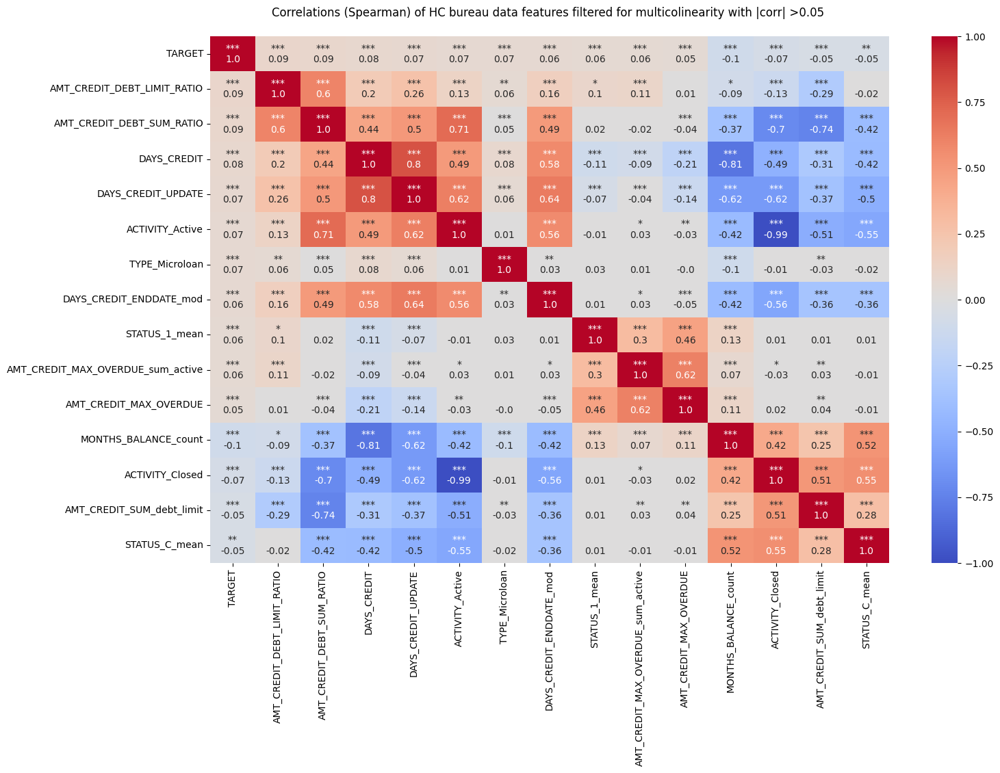

In [101]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

We can use the matrix to discard multicolinearity between the selected features:

* remove DAYS_CREDIT_ENDDATE and DAYS_ENDDATE_FACT and use updated columns DAYS_CREDIT_ENDDATE_mod and DAYS_ENDDATE_FACT_mod instead

* drop STATUS_C for ACTIVITY_Closed

* ACTIVITY_Closed vs ACTIVITY_Active

In [102]:
last_multicols = [] #['DAYS_CREDIT_ENDDATE_mod', 'DAYS_ENDDATE_FACT_mod']

In [103]:
final_multicol_reduced_feat = multicol_reduced_feat.copy()
for item in last_multicols:
    if item in final_multicol_reduced_feat:
        final_multicol_reduced_feat.remove(item)

print('We are left with', len(final_multicol_reduced_feat), 'numerical features.')

We are left with 15 numerical features.


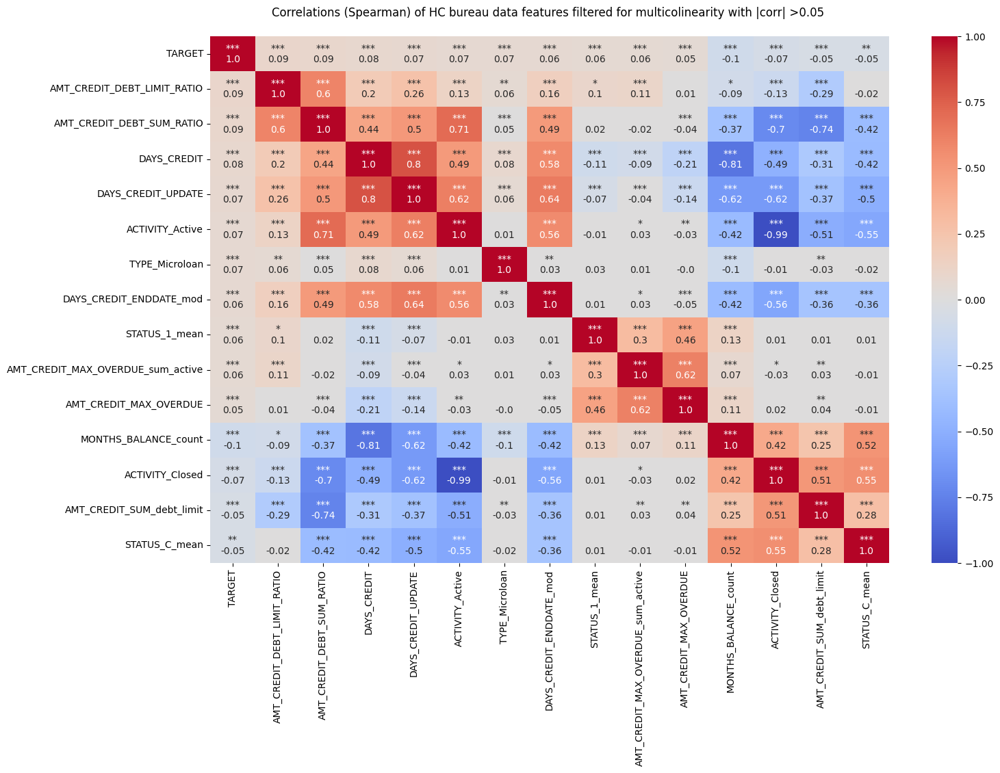

In [104]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, final_multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

#### Target Scatter Matrix

In [105]:
final_multicol_reduced_feat

['TARGET',
 'AMT_CREDIT_DEBT_LIMIT_RATIO',
 'AMT_CREDIT_DEBT_SUM_RATIO',
 'DAYS_CREDIT',
 'DAYS_CREDIT_UPDATE',
 'ACTIVITY_Active',
 'TYPE_Microloan',
 'DAYS_CREDIT_ENDDATE_mod',
 'STATUS_1_mean',
 'AMT_CREDIT_MAX_OVERDUE_sum_active',
 'AMT_CREDIT_MAX_OVERDUE',
 'MONTHS_BALANCE_count',
 'ACTIVITY_Closed',
 'AMT_CREDIT_SUM_debt_limit',
 'STATUS_C_mean']

In [106]:
#%time
%reload_ext autoreload

num_features = final_multicol_reduced_feat.copy()
#
#df = LCacc_PC_EDA
to_scatter = num_features #[:6]
#to_scatter.extend(['TARGET'])

dfunc.scattermatrix(
    df_target,
    [to_scatter],
    colors = ['TARGET'],
    titles= [""],
)

## Tests

Do the features have a significant influence on the response variable (insurance)?

#### Normality Check for Numeric Data

In [107]:
features = num_feat

shapiros = []
JB_tests =[]

for feature in features:
    shapiros.append(pg.normality(df_target[feature], method="shapiro"))
    JB_tests.append(pg.normality(df_target[feature], method="jarque_bera"))

shapiro = pd.concat(shapiros).reset_index()
JB_test = pd.concat(JB_tests).reset_index()

shapiro['signif'] = shapiro['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))
JB_test['signif'] = JB_test['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))

normality = shapiro
normality = normality.merge(JB_test, on='index', suffixes = ['_SH', '_JB'], )
normality.round(4)

,index,W_SH,pval_SH,normal_SH,signif_SH,W_JB,pval_JB,normal_JB,signif_JB
0,SK_ID_CURR,0.9540,0.0,False,***,6.083871e+02,0.0,False,***
1,TARGET,0.3038,0.0,False,***,3.804404e+04,0.0,False,***
2,AMT_REQ_CREDIT_BUREAU_QRT,0.4899,0.0,False,***,4.865194e+04,0.0,False,***
3,DAYS_CREDIT,0.9802,0.0,False,***,4.247583e+02,0.0,False,***
4,CREDIT_DAY_OVERDUE,0.0274,0.0,False,***,2.970612e+08,0.0,False,***
5,AMT_CREDIT_MAX_OVERDUE,0.0419,0.0,False,***,5.735695e+08,0.0,False,***
6,CNT_CREDIT_PROLONG,0.0969,0.0,False,***,7.910963e+07,0.0,False,***
7,AMT_CREDIT_SUM,0.4095,0.0,False,***,5.434059e+06,0.0,False,***
8,AMT_CREDIT_SUM_DEBT,0.2880,0.0,False,***,1.195623e+07,0.0,False,***
9,AMT_CREDIT_SUM_LIMIT,0.2298,0.0,False,***,5.918425e+06,0.0,False,***


### Difference in Feature Mean for Fully Paid and Charged Off: Independent 2-sample T-test

Hypothesis for a given feature: Mean(Fully Paid) = Mean(Charged Off)

Alternative: Mean(Fully Paid) != Mean(Charged Off)

Significance level: alpha = 0.05

Normality cannot be assumed for any of the numeric features.
But the sample size ist large enough for the central limit theorem to hold.

I conduct a two-sided t-test, but to be on the safe side I also conduct a non-parametric test, the Mann-Whitney-U-Test.

In [108]:
collect_res=[]

charged_off = df_target.loc[df_target.TARGET_mod == 'Payment Issues']
fully_paid = df_target.loc[df_target.TARGET_mod == 'No Payment Issues']

features = num_feat


from scipy.stats import mannwhitneyu


for feature in features:
    fully_paid_feat = fully_paid.loc[~fully_paid[feature].isna()][feature]
    charged_off_feat = charged_off.loc[~charged_off[feature].isna()][feature]
    res = pg.ttest(fully_paid_feat, charged_off_feat, paired=False)
    res['feature'] = feature
    res['MWU-p-val'] = mannwhitneyu(fully_paid_feat, charged_off_feat).pvalue
    collect_res.append(res)

all_res = pd.concat(collect_res)


In [109]:
all_res.reset_index(inplace=True, drop=True)
all_res[['feature', 'p-val', 'CI95%', 'MWU-p-val' ]].round(4).style.background_gradient(cmap="Blues")


,feature,p-val,CI95%,MWU-p-val
0,SK_ID_CURR,0.410300,[-10428.54 4262.13],0.410100
1,TARGET,0.000000,[nan nan],0.000000
2,AMT_REQ_CREDIT_BUREAU_QRT,0.002300,[0.02 0.1 ],0.002600
3,DAYS_CREDIT,0.000000,[-209.87 -131.1 ],0.000000
4,CREDIT_DAY_OVERDUE,0.170000,[-4.07 0.72],0.006900
5,AMT_CREDIT_MAX_OVERDUE,0.255700,[-6500.72 1731.11],0.000000
6,CNT_CREDIT_PROLONG,0.898500,[-0. 0.],0.443000
7,AMT_CREDIT_SUM,0.000000,[ 43567.29 103190.85],0.327000
8,AMT_CREDIT_SUM_DEBT,0.289200,[-10712.68 35913.7 ],0.000000
9,AMT_CREDIT_SUM_LIMIT,0.088300,[-221.38 3171.27],0.053000


In [110]:
p_cut_off = 0.05

loan_status_insignificant = all_res[['feature', 'p-val', 'MWU-p-val']
                ].loc[#(all_res['p-val']
                #> p_cut_off) |
                 (all_res['MWU-p-val']
                > p_cut_off)
                ].round(1)

len(loan_status_insignificant), loan_status_insignificant.feature.to_list()


(22,
 ['SK_ID_CURR',
  'CNT_CREDIT_PROLONG',
  'AMT_CREDIT_SUM',
  'AMT_CREDIT_SUM_LIMIT',
  'AMT_ANNUITY',
  'int_rate',
  'AMT_ANNUITY_CREDIT_ratio',
  'CNT_CREDIT_PROLONG_bin',
  'CURRENCY_1',
  'ACTIVITY_Sold-Bad',
  'TYPE_Consumer_credit',
  'TYPE_Credit_card',
  'TYPE_Other_loan_types',
  'MONTHS_BALANCE',
  'STATUS_2_mean',
  'STATUS_3_mean',
  'STATUS_4_mean',
  'STATUS_5_mean',
  'STATUS_X_mean',
  'SK_ID_BUREAU_count',
  'AMT_CREDIT_SUM_sum_active',
  'AMT_CREDIT_SUM_LIMIT_sum_active'])


With |t-statistics| > xxxx and
p-values < xxxx for a significance level alpha = 0.05, I can reject the null hypothesis (=no difference in means) for all numerical features, except from xxxxx.

Based on the estimated difference in sample means, I can support that there is a significant difference between the population means for xxx, xxx, xxx for paid and charged off loan.

This finding confirms our expectation from the correlation matrix.

### Other (Non-)Parametric Tests:

Hypothesis for a given feature:

The proportions/means for the targets's classes
do not differ, i.e. Mean(class x) = Mean(class y) for all x, y in classes of a feature

Alternative: The proportions/means for the targets's classes
are different.

Significance level: alpha = 0.05

In [111]:
targets = ['TARGET']

#### ANOVA

In [112]:
features = num_feat
collect_drops_f_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_classif = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_classif')
    print(feature_f_classif.round(3))
    collect_drops_target = feature_f_classif.loc[(feature_f_classif[
                                                     'f_classif_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                   f_classif_scores  f_classif_pvals
SK_ID_CURR                                    0.657            0.418
AMT_REQ_CREDIT_BUREAU_QRT                     0.244            0.621
DAYS_CREDIT                                   0.051            0.821
CREDIT_DAY_OVERDUE                            1.647            0.200
AMT_CREDIT_MAX_OVERDUE                        0.036            0.850
CNT_CREDIT_PROLONG                            0.015            0.903
AMT_CREDIT_SUM                                0.052            0.820
AMT_CREDIT_SUM_DEBT                           1.923            0.166
AMT_CREDIT_SUM_LIMIT                          4.564            0.033
AMT_CREDIT_SUM_OVERDUE                        0.493            0.483
DAYS_CREDIT_UPDATE                            1.713            0.191
AMT_ANNUITY                                   0.039            0.845
DAYS_CREDIT_ENDDATE_mod                 

In [113]:
collect_drops_f_classif

[['SK_ID_CURR',
  'AMT_REQ_CREDIT_BUREAU_QRT',
  'DAYS_CREDIT',
  'CREDIT_DAY_OVERDUE',
  'AMT_CREDIT_MAX_OVERDUE',
  'CNT_CREDIT_PROLONG',
  'AMT_CREDIT_SUM',
  'AMT_CREDIT_SUM_DEBT',
  'AMT_CREDIT_SUM_OVERDUE',
  'DAYS_CREDIT_UPDATE',
  'AMT_ANNUITY',
  'DAYS_CREDIT_ENDDATE_mod',
  'DAYS_ENDDATE_FACT_mod',
  'TERM_PLANNED_months',
  'TERM_ACTUAL_months',
  'TERM_change_months',
  'AMT_ANNUITY_plain',
  'int_rate',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_CREDIT_SUM_debt_limit',
  'CNT_CREDIT_PROLONG_bin',
  'CREDIT_DAY_OVERDUE_cat',
  'CURRENCY_1',
  'ACTIVITY_Active',
  'ACTIVITY_Closed',
  'TYPE_Car_loan',
  'TYPE_Consumer_credit',
  'TYPE_Credit_card',
  'TYPE_Microloan',
  'TYPE_Mortgage',
  'TYPE_Other_loan_types',
  'MONTHS_BALANCE',
  'MONTHS_BALANCE_count',
  'STATUS_0_mean',
  'STATUS_1_mean',
  'STATUS_2_mean',
  'STATUS_3_mean',
  'STATUS_4_mean',
  'STATUS_5_mean',
  'STATUS_C_mean',
  'STATUS_X_mean',
  'SK_ID_BUREAU_count',
  'AMT_ANNUITY_sum_active_bureau',
  'AMT_CREDIT_M

#### Regression

In [114]:
%reload_ext autoreload

features = num_feat
collect_drops_f_regress=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_regress_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_regress')
    print(feature_f_regress_num.round(3))
    collect_drops_target = feature_f_regress_num.loc[(feature_f_regress_num[
                                                     'f_regress_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_regress.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                   f_regress_scores  f_regress_pvals
SK_ID_CURR                                    0.657            0.418
AMT_REQ_CREDIT_BUREAU_QRT                     0.244            0.621
DAYS_CREDIT                                   0.051            0.821
CREDIT_DAY_OVERDUE                            1.647            0.200
AMT_CREDIT_MAX_OVERDUE                        0.036            0.850
CNT_CREDIT_PROLONG                            0.015            0.903
AMT_CREDIT_SUM                                0.052            0.820
AMT_CREDIT_SUM_DEBT                           1.923            0.166
AMT_CREDIT_SUM_LIMIT                          4.564            0.033
AMT_CREDIT_SUM_OVERDUE                        0.493            0.483
DAYS_CREDIT_UPDATE                            1.713            0.191
AMT_ANNUITY                                   0.039            0.845
DAYS_CREDIT_ENDDATE_mod                 

In [115]:
collect_drops_f_regress

[['SK_ID_CURR',
  'AMT_REQ_CREDIT_BUREAU_QRT',
  'DAYS_CREDIT',
  'CREDIT_DAY_OVERDUE',
  'AMT_CREDIT_MAX_OVERDUE',
  'CNT_CREDIT_PROLONG',
  'AMT_CREDIT_SUM',
  'AMT_CREDIT_SUM_DEBT',
  'AMT_CREDIT_SUM_OVERDUE',
  'DAYS_CREDIT_UPDATE',
  'AMT_ANNUITY',
  'DAYS_CREDIT_ENDDATE_mod',
  'DAYS_ENDDATE_FACT_mod',
  'TERM_PLANNED_months',
  'TERM_ACTUAL_months',
  'TERM_change_months',
  'AMT_ANNUITY_plain',
  'int_rate',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_CREDIT_SUM_debt_limit',
  'CNT_CREDIT_PROLONG_bin',
  'CREDIT_DAY_OVERDUE_cat',
  'CURRENCY_1',
  'ACTIVITY_Active',
  'ACTIVITY_Closed',
  'TYPE_Car_loan',
  'TYPE_Consumer_credit',
  'TYPE_Credit_card',
  'TYPE_Microloan',
  'TYPE_Mortgage',
  'TYPE_Other_loan_types',
  'MONTHS_BALANCE',
  'MONTHS_BALANCE_count',
  'STATUS_0_mean',
  'STATUS_1_mean',
  'STATUS_2_mean',
  'STATUS_3_mean',
  'STATUS_4_mean',
  'STATUS_5_mean',
  'STATUS_C_mean',
  'STATUS_X_mean',
  'SK_ID_BUREAU_count',
  'AMT_ANNUITY_sum_active_bureau',
  'AMT_CREDIT_M

#### Mutual Information

In [116]:
%reload_ext autoreload

features = num_feat
collect_drops_mutual_info_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_mic_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'mutual_info_classif')
    print(feature_mic_num.round(3))
    collect_drops_target = feature_mic_num.loc[(feature_mic_num[
                                                     'mutual_info_classif_scores']
                                                     < 0.01)
                                                     ].index.to_list()
    collect_drops_mutual_info_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                                   mutual_info_classif_scores
SK_ID_CURR                                              0.000
AMT_REQ_CREDIT_BUREAU_QRT                               0.022
DAYS_CREDIT                                             0.000
CREDIT_DAY_OVERDUE                                      0.000
AMT_CREDIT_MAX_OVERDUE                                  0.015
CNT_CREDIT_PROLONG                                      0.000
AMT_CREDIT_SUM                                          0.000
AMT_CREDIT_SUM_DEBT                                     0.027
AMT_CREDIT_SUM_LIMIT                                    0.026
AMT_CREDIT_SUM_OVERDUE                                  0.000
DAYS_CREDIT_UPDATE                                      0.000
AMT_ANNUITY                                             0.006
DAYS_CREDIT_ENDDATE_mod                                 0.005
DAYS_ENDDATE_FACT_mod                                   0.000
TERM_PL

In [117]:
collect_drops_mutual_info_classif

[['SK_ID_CURR',
  'DAYS_CREDIT',
  'CREDIT_DAY_OVERDUE',
  'CNT_CREDIT_PROLONG',
  'AMT_CREDIT_SUM',
  'AMT_CREDIT_SUM_OVERDUE',
  'DAYS_CREDIT_UPDATE',
  'AMT_ANNUITY',
  'DAYS_CREDIT_ENDDATE_mod',
  'DAYS_ENDDATE_FACT_mod',
  'TERM_PLANNED_months',
  'TERM_ACTUAL_months',
  'TERM_change_months',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_CREDIT_SUM_debt_limit',
  'AMT_CREDIT_DEBT_LIMIT_RATIO',
  'AMT_CREDIT_DEBT_SUM_RATIO',
  'CNT_CREDIT_PROLONG_bin',
  'CREDIT_DAY_OVERDUE_cat',
  'CURRENCY_1',
  'ACTIVITY_Active',
  'TYPE_Car_loan',
  'TYPE_Credit_card',
  'TYPE_Microloan',
  'TYPE_Mortgage',
  'TYPE_Other_loan_types',
  'MONTHS_BALANCE',
  'MONTHS_BALANCE_count',
  'STATUS_0_mean',
  'STATUS_2_mean',
  'STATUS_3_mean',
  'STATUS_4_mean',
  'STATUS_5_mean',
  'STATUS_C_mean',
  'STATUS_X_mean',
  'SK_ID_BUREAU_count',
  'AMT_ANNUITY_sum_active_bureau',
  'AMT_CREDIT_MAX_OVERDUE_sum_active',
  'AMT_CREDIT_SUM_sum_active',
  'AMT_CREDIT_SUM_DEBT_sum_active',
  'SK_ID_BUREAU_active_count']]

Based on the samples and the p-values for a significance level alpha = 0.05, I have enough evidence to reject the null hypothesis for the features XXXXX

I conclude that there is a significant difference between the response variables' proportion of each of the classes for a given feature.

We fail to reject the null hypothesis for the features xxxxxx.

This finding confirms our expectation from the correlation matrix that the xxxx are not correlated with the response variables.


In [118]:
MI_drop = collect_drops_mutual_info_classif[0]
f_clas_drop = collect_drops_f_classif[0]
MWU_drop = loan_status_insignificant.feature.to_list()

collected_drops = MI_drop + f_clas_drop + MWU_drop
collected_drop_lists = [MI_drop, f_clas_drop, MWU_drop]

# set of all drops found by tests
all_unique_drops = list(set(collected_drops))
all_unique_drops.sort()


# drops common in all tests (except chi2)
common_drops = set(MI_drop) & set(f_clas_drop) & set(MWU_drop)
common_drops = list(common_drops)
common_drops.sort()

all_unique_drops, common_drops #, collected_drop_lists

(['ACTIVITY_Active',
  'ACTIVITY_Closed',
  'ACTIVITY_Sold-Bad',
  'AMT_ANNUITY',
  'AMT_ANNUITY_CREDIT_ratio',
  'AMT_ANNUITY_plain',
  'AMT_ANNUITY_sum_active_bureau',
  'AMT_CREDIT_DEBT_LIMIT_RATIO',
  'AMT_CREDIT_DEBT_SUM_RATIO',
  'AMT_CREDIT_MAX_OVERDUE',
  'AMT_CREDIT_MAX_OVERDUE_sum_active',
  'AMT_CREDIT_SUM',
  'AMT_CREDIT_SUM_DEBT',
  'AMT_CREDIT_SUM_DEBT_sum_active',
  'AMT_CREDIT_SUM_LIMIT',
  'AMT_CREDIT_SUM_LIMIT_sum_active',
  'AMT_CREDIT_SUM_OVERDUE',
  'AMT_CREDIT_SUM_OVERDUE_sum_active',
  'AMT_CREDIT_SUM_debt_limit',
  'AMT_CREDIT_SUM_sum_active',
  'AMT_REQ_CREDIT_BUREAU_QRT',
  'CNT_CREDIT_PROLONG',
  'CNT_CREDIT_PROLONG_bin',
  'CREDIT_DAY_OVERDUE',
  'CREDIT_DAY_OVERDUE_cat',
  'CURRENCY_1',
  'DAYS_CREDIT',
  'DAYS_CREDIT_ENDDATE_mod',
  'DAYS_CREDIT_UPDATE',
  'DAYS_ENDDATE_FACT_mod',
  'MONTHS_BALANCE',
  'MONTHS_BALANCE_count',
  'SK_ID_BUREAU_active_count',
  'SK_ID_BUREAU_count',
  'SK_ID_CURR',
  'STATUS_0_mean',
  'STATUS_1_mean',
  'STATUS_2_mean',
  'S